In [5]:
import os
import sys

sys.path.append(os.getcwd())

from coco_api import COCOAnnotations, COCOHandler, PlotType

In [3]:
os.chdir(os.path.join(os.path.dirname("/home/ccamille/biowaste_GAN/LSP5_compost/"), "./UAVVaste"))
coco_handler = COCOHandler[COCOAnnotations]("./annotations/annotations.json")

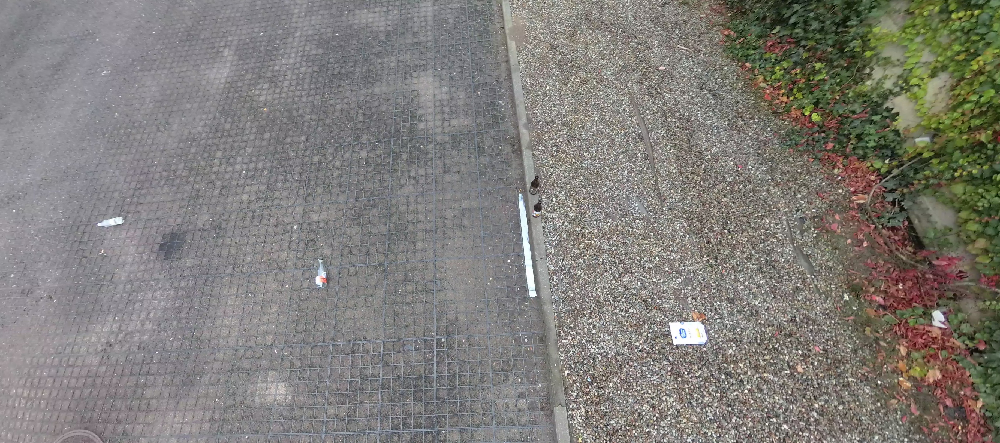

In [15]:
coco_handler.load_image("/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste/images", img_name ="batch_s02_img_85")

batch_s02_img_85
<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=3668x1628 at 0x7F92EDC1D050>
COCOAnnotation(id=1493, image_id=256, category_id=0, segmentation=[[2452, 1185, 2468, 1271, 2584, 1266, 2597, 1250, 2587, 1195, 2564, 1177]], area=11373.0, bbox=[2452, 1177, 144, 93], iscrowd=0)


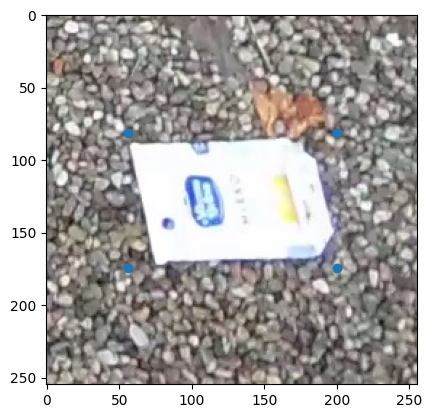

/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images_crop/batch_s02_img_85_annot1493.jpg
COCOAnnotation(id=1494, image_id=256, category_id=0, segmentation=[[1154, 1058, 1169, 1058, 1182, 1058, 1197, 1050, 1199, 995, 1184, 952, 1161, 951, 1156, 997]], area=4067.0, bbox=[1154, 951, 45, 106], iscrowd=0)


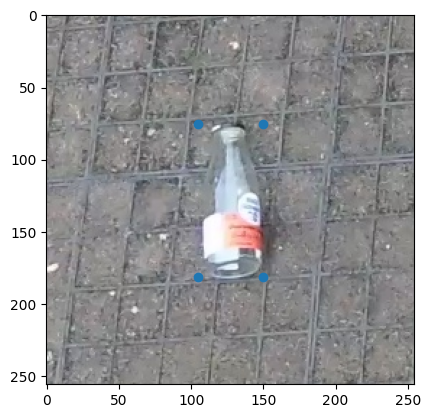

/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images_crop/batch_s02_img_85_annot1494.jpg
COCOAnnotation(id=1495, image_id=256, category_id=0, segmentation=[[1939, 706, 1946, 714, 1954, 714, 1964, 711, 1977, 678, 1971, 671, 1977, 648, 1961, 645, 1959, 671, 1949, 673]], area=1470.5, bbox=[1939, 645, 37, 68], iscrowd=0)


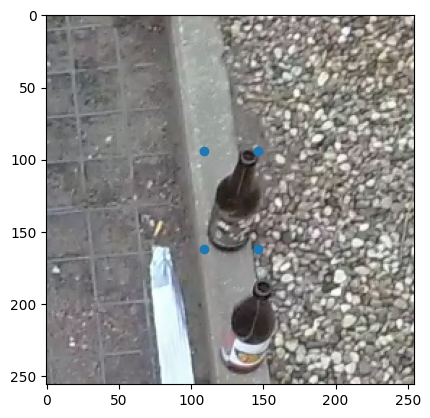

/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images_crop/batch_s02_img_85_annot1495.jpg
COCOAnnotation(id=1496, image_id=256, category_id=0, segmentation=[[1946, 787, 1951, 792, 1964, 800, 1979, 792, 1989, 764, 1987, 739, 1979, 736, 1969, 752, 1959, 754]], area=1626.0, bbox=[1946, 736, 43, 63], iscrowd=0)


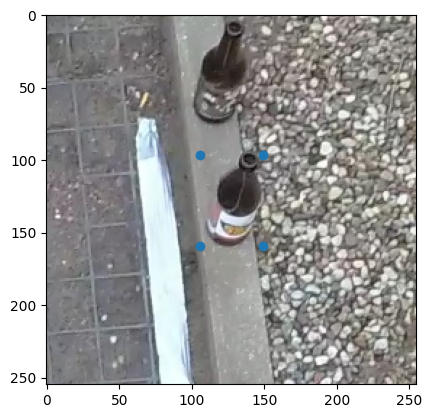

/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images_crop/batch_s02_img_85_annot1496.jpg
COCOAnnotation(id=1497, image_id=256, category_id=0, segmentation=[[445, 797, 458, 812, 448, 823, 382, 835, 356, 833, 356, 820, 377, 810]], area=2361.5, bbox=[356, 797, 101, 38], iscrowd=0)


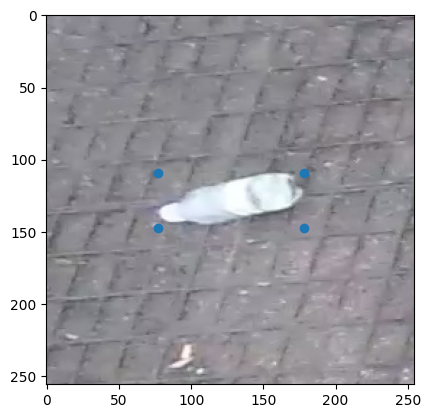

/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images_crop/batch_s02_img_85_annot1497.jpg
COCOAnnotation(id=1498, image_id=256, category_id=0, segmentation=[[1944, 1091, 1971, 1088, 1926, 749, 1916, 714, 1903, 714, 1901, 744]], area=9481.5, bbox=[1901, 714, 70, 377], iscrowd=0)
image_too_large


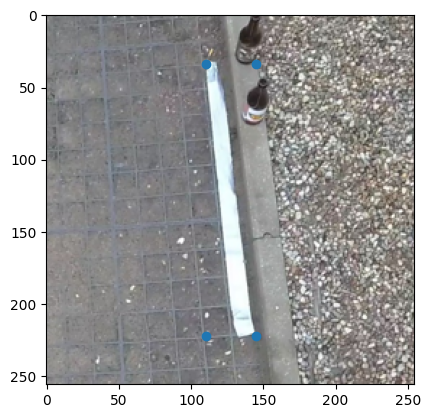

/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images_crop/batch_s02_img_85_annot1498.jpg


In [14]:
# (c) EPFL - LTS5, 2023

import os
import sys
import json
import os
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import tarfile
import pickle
import numpy as np
from tqdm import tqdm
import cv2
from PIL import Image

sys.path.append(os.getcwd())

from coco_api import COCOAnnotations, COCOHandler, PlotType

def image_crop (coco_handler, img_name_list,img_root_dir, image_path_save, bbox_path_save, size ) :
	for img_name in img_name_list : 
		print(img_name)
		
		image = coco_handler.load_image(img_root_dir, img_name = img_name)
		print(image)
		width, height = image.size
		for annot in coco_handler.get_img_annots(img_name=img_name):
			print(annot)
			img = image
			bbox = annot.bbox
			bbox = {"y": bbox[1], "x": bbox[0], "w": bbox[0] + bbox[2], "h": bbox[1] + bbox[3]}
			size_bbox = [bbox["h"]-bbox["y"], bbox["w"]-bbox["x"]]

			while size_bbox[0] > size or size_bbox[1] > size :
				print("image_too_large")
				img = img.resize((int(width/2),int(height/2)), Image.BICUBIC)
				bbox = {"y": int(bbox["y"]/2), "x": int(bbox["x"]/2), "w": int(bbox["w"]/2), "h": int(bbox["h"]/2)}
				size_bbox = [bbox["h"]-bbox["y"], bbox["w"]-bbox["x"]]
				width, height = img.size

			left = bbox["x"]+int(size_bbox[1]/2-size/2)
			top = bbox["y"]+int(size_bbox[0]/2+size/2)
			right = bbox["x"]+int(size_bbox[1]/2+size/2)
			bottom = bbox["y"]+int(size_bbox[0]/2-size/2)

			if left <0 :
				diff = 0-left
				left = 0
				right = right + diff
			if right > width :
				diff = right -width
				right = width
				left = left - diff
			if top > height :
				diff = top -height
				top = height
				bottom = bottom - diff
			if bottom <0 :
				diff = 0 - bottom
				bottom = 0
				top = top + diff

			bbox = {"y": bbox["y"]-bottom, "x": bbox["x"]-left, "w": bbox["w"]-left, "h": bbox["h"]-bottom}

			img = img.crop((left,bottom,right,top))

			plt.imshow(img)
			plt.scatter (x= [bbox["x"],bbox["x"],bbox["w"],bbox["w"]], y=[bbox["y"],bbox["h"],bbox["y"],bbox["h"]])
			plt.show()

			im_path = image_path_save + img_name + "_annot" + str(annot.id) + ".jpg"
			bbox_path = bbox_path_save + img_name + "_annot" + str(annot.id) + ".json"
			print(im_path)
			img.save(im_path)

			

			with open(bbox_path, "w") as outfile:
				json.dump(bbox, outfile)


os.chdir(os.path.join(os.path.dirname("/home/ccamille/biowaste_GAN/LSP5_compost/"), "./UAVVaste"))
coco_handler = COCOHandler[COCOAnnotations]("./annotations/annotations.json")
image_crop (coco_handler, 
            ["batch_s02_img_85"], 
            "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste/images",
            "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images_crop/",
            "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/bbox_crop/",
            256)



In [22]:
def replace_plastics_with_noise(path_images, path_bounding_boxes, path_save, noise_fct):
    # Iterate over the bounding boxes
    for _, _, fnames in sorted(os.walk(path_images)): 
        for fname in tqdm(fnames) :
        
            image = cv2.imread(path_images + fname,1)

            with open(path_bounding_boxes + os.path.splitext(fname)[0] + ".json" ) as json_file:
                bbox = json.load(json_file)
            
            roi = image[bbox["y"]:bbox["h"], bbox["x"]:bbox["w"]] 

            if (noise_fct == "b_w") :
                noise = np.random.randint(0, 2, size=[roi.shape[0],roi.shape[1]])
                noise = np.where (noise ==1,255,0)
                noise = np.repeat(noise[:, :, np.newaxis], 3, axis=2)
            if ( noise_fct =="color") :
                noise = np.random.randint(0, 256, roi.shape, dtype=np.uint8)
            if (noise_fct == "gaussian") :
                noise=np.zeros(roi.shape,dtype=np.uint8)
                cv2.randn(noise,(128,128,128),(20,20,20))
                noise=(noise).astype(np.uint8)
            if (noise_fct =="gaussian_b_w") :
                noise=np.zeros([roi.shape[0],roi.shape[1]],dtype=np.uint8)
                cv2.randn(noise,128,20)
                noise=(noise).astype(np.uint8)
                noise = np.repeat(noise[:, :, np.newaxis], 3, axis=2)
                noise = noise.reshape(roi.shape)

            # Replace the ROI with random noise
            image[bbox["y"]:bbox["h"], bbox["x"]+256:bbox["w"]+256] = noise
            plt.imshow(image)
            plt.show()
            im_path = path_save + fname
            cv2.imwrite(im_path, image)

  0%|          | 0/1 [00:00<?, ?it/s]

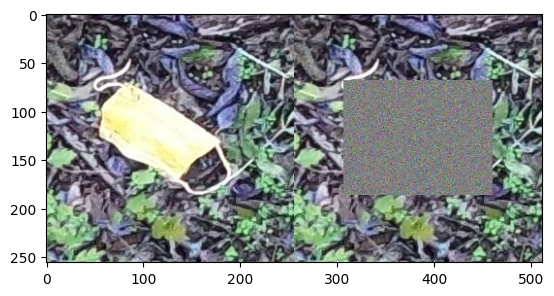

100%|██████████| 1/1 [00:00<00:00, 13.22it/s]


In [23]:
img_crop_path = "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data_one/images/train/"
bbox_crop_path = "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data_one/bbox/train/"
img_noise_path = "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data_one/images/train/"
replace_plastics_with_noise( img_crop_path, bbox_crop_path, img_noise_path, "gaussian")

In [34]:

if 23>2 or 23 in [1,2,3,4] :
    print("z")

z


In [43]:
# How to Move Multiple Files with Python
import os
import shutil

path_images = "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images/"
path_bbox = "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/bbox/"
destination_images = "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images/test/"
destination_bbox = "/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/bbox/test/"

split = int(3014*80/100)
print(split)

for _, _, fnames in sorted(os.walk(path_images)): 
    for fname in tqdm(fnames[0:split]) :
        shutil.move(path_images + fname, destination_images)
        shutil.move(path_bbox + os.path.splitext(fname)[0] + ".json", destination_bbox)

2411


100%|██████████| 603/603 [00:00<00:00, 37847.59it/s]
0it [00:00, ?it/s]
  0%|          | 0/2411 [00:00<?, ?it/s]


FileNotFoundError: [Errno 2] No such file or directory: '/home/ccamille/biowaste_GAN/LSP5_compost/UAVVaste_data/images/batch_05_img_780_annot2271.jpg'